In [1]:
# This changes the current directory to the base saga directory - make sure to run this first!
# This is necessary to be able to import the py files and use the right directories,
# while keeping all the notebooks in their own directory.
import os
import sys

if 'saga_base_dir' not in locals():
    saga_base_dir = os.path.abspath('..')

if saga_base_dir not in sys.path:
    os.chdir(saga_base_dir)

In [2]:
from __future__ import print_function

import hosts
import targeting
import mmthecto
import numpy as np

from astropy import units as u
from astropy.coordinates import *
from astropy import table
from astropy.table import Table
from astropy.io import fits

In [3]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import rcParams

rcParams['image.interpolation'] = 'none'
rcParams['figure.figsize'] = (16, 10)

In [4]:
hostlst = hosts.get_saga_hosts_from_google(useobservingsummary=True) #'named' hosts

Using cached version of google hosts list from file "hosts_dl.pkl"


In [5]:
candidates = """
NSAID    RA   DEC Name
   150887      23.2455      4.53406  N/A
    150578.      23.0824      12.3229  N/A
    149781.      22.3942     -3.43167  OBrother
    150307.      22.9283     -5.49535  N/A
    61945.0      23.6087     0.297265  AnaK
    149977.      22.6248      10.5315  N/A
    153017.      23.9904      20.7498  N/A
    126115.    0.0663717      20.7524  N/A
    127226.     0.579656     -8.39644  N/A
    129387.      1.40109      12.9175  N/A
    129237.      1.36327      17.5922  N/A
    132339.      2.63655     -1.31876 Narnia
    130133.      1.65181     -7.51266  N/A
    131531.      2.25767      6.00248  N/A
    130625.      1.88703      4.19576  N/A
"""
candidates = Table.read(candidates,format='ascii')

hostdct = dict([(h.name, h) for h in hostlst])
candhosts = [hostdct[name] if name in hostdct else hosts.NSAHost(int(nsaid)) 
         for nsaid, name in zip(candidates['NSAID'], candidates['Name'])]
candhosts

[<hosts.NSAHost object w/ name 'NSA150887'>,
 <hosts.NSAHost object w/ name 'NSA150578'>,
 <hosts.NSAHost object w/ name 'OBrother' AKA: ['NSA149781']>,
 <hosts.NSAHost object w/ name 'NSA150307'>,
 <hosts.NSAHost object w/ name 'AnaK' AKA: ['NGC7716', 'NSA61945']>,
 <hosts.NSAHost object w/ name 'NSA149977'>,
 <hosts.NSAHost object w/ name 'NSA153017'>,
 <hosts.NSAHost object w/ name 'NSA126115'>,
 <hosts.NSAHost object w/ name 'NSA127226'>,
 <hosts.NSAHost object w/ name 'NSA129387'>,
 <hosts.NSAHost object w/ name 'NSA129237'>,
 <hosts.NSAHost object w/ name 'Narnia' AKA: ['NGC1015', 'NSA132339']>,
 <hosts.NSAHost object w/ name 'NSA130133'>,
 <hosts.NSAHost object w/ name 'NSA131531'>,
 <hosts.NSAHost object w/ name 'NSA130625'>]

In [6]:
# now set to the latest base catalogs
for h in candhosts:
    h.fnsdss = 'catalogs/base_sql_nsa{0}.fits.gz'.format(h.nsaid)
    h._cached_sdss = None

In [7]:
# actually make sure they're loaded here
for h in candhosts:
    h.get_sdss_catalog()
h.get_sdss_catalog() # just to see

objID,ra,dec,flags,specObjID,u,g,r,i,z,u_err,g_err,r_err,i_err,z_err,Au,Ag,Ar,Ai,Az,fibermag_r,fiber2mag_r,expRad_r,sb_exp_r,petroR50_r,petroR90_r,petroMag_r,sb_petro_r,J,Jerr,H,Herr,K,Kerr,w1,w1err,w2,w2err,spec_z,spec_z_err,spec_z_warn,photoz,photoz_err,HOST_RA,HOST_DEC,HOST_DIST,HOST_VHOST,HOST_MK,HOST_NSAID,HOST_FLAG,HOST_SAGA_NAME,RHOST_ARCM,RHOST_KPC,OBJ_NSAID,PCLASS_1,SATS,REMOVE,TELNAME,MASKNAME,ZQUALITY,SPEC_REPEAT,U,B,V,R,I,rhost,rhost_kpc,type,phot_sg
int64,float64,float64,int64,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,float32,float32,float64,float64,float64,float64,float64,int64,int64,string384,float64,float64,int64,int64,int64,int64,string32,string384,float64,string384,float32,float32,float32,float32,float32,float64,float64,int16,string48
1237678622239687293,28.2921893761,4.1654677952,387097114444048,0,24.8861,24.5384,22.9648,21.9456,21.3148,0.966116,0.565863,0.238203,0.135154,0.280791,0.19371,0.14253,0.103375,0.0783858,0.0555765,22.261,22.9741,0.132225,20.5668021324,0.641864,1.37584,22.9859,24.0185837122,9999.0,9999.0,9999.0,9999.0,9999.0,9999.0,17.9499,0.207252,16.003,0.175,-1.0,-1.0,-1,0.595791,0.082322,28.3054,4.19576,22.7469,1733.0,8.726,130625,0,,1.98200266096,13.114524378,-1,-1,-1,-1,,,-1.0,,25.4448,25.2499,23.6333,22.6919,21.3051,0.0330198482762,12.9620185552,3,GALAXY
1237678622239687535,28.2808531784,4.17348908215,281543964623616,0,24.2549,23.1379,21.9114,21.7858,21.6071,0.975535,0.212821,0.0979778,0.120167,0.359127,0.193723,0.142539,0.103381,0.078391,0.0555802,22.2951,22.7768,0.216964,20.5887781366,0.590522,1.3195,22.0478,22.8994797037,9999.0,9999.0,9999.0,9999.0,9999.0,9999.0,19.4984,0.848584,9999.0,9999.0,-1.0,-1.0,-1,-1.0,-1.0,28.3054,4.19576,22.7469,1733.0,8.726,130625,0,,1.98573241428,13.1392034243,-1,-1,-1,-1,,,-1.0,,24.1516,23.7408,22.4289,21.7752,21.3198,0.0330706320147,12.9819538303,6,STAR
1237678622239687551,28.2892305507,4.1666156998,281543964623104,0,23.538,23.6733,22.7989,22.2601,21.7235,0.647714,0.320625,0.201627,0.175092,0.371933,0.193668,0.142499,0.103352,0.078369,0.0555646,22.9504,23.4056,0.00149116,10.6619883934,-9999.0,-9999.0,27.0005,48.9956979059,9999.0,9999.0,9999.0,9999.0,9999.0,9999.0,17.5289,0.137348,9999.0,9999.0,-1.0,-1.0,-1,0.637883,0.137668,28.3054,4.19576,22.7469,1733.0,8.726,130625,0,,1.99849702866,13.2236643743,-1,-1,-1,-1,,,-1.0,,23.739,24.1659,23.1633,22.5995,21.656,0.0332919091918,13.0688167029,3,GALAXY
1237678661436375815,28.3178710528,4.22726178032,281543964623616,0,26.1572,22.1578,21.4868,20.0189,19.5865,1.65004,0.2729,0.266116,0.109058,0.29841,0.196014,0.144225,0.104604,0.079318,0.0562375,23.1452,23.5192,0.264709,21.7103790809,3.99238,6.47142,21.4839,26.4855161938,9999.0,9999.0,9999.0,9999.0,9999.0,9999.0,18.7934,0.469792,9999.0,9999.0,-1.0,-1.0,-1,0.9529,0.184473,28.3054,4.19576,22.7469,1733.0,8.726,130625,0,,2.03209360161,13.4459663078,-1,-1,-1,-1,,,-1.0,,24.2021,22.5868,21.7627,21.1452,19.455,0.0338807234169,13.2999571021,3,GALAXY
1237678661436375822,28.3379290684,4.18852269949,281475245277440,0,23.64,23.186,23.3671,21.5564,21.3618,0.947116,0.258817,0.522418,0.157588,0.518212,0.195576,0.143903,0.10437,0.079141,0.0561119,23.8665,24.1587,4.25089,27.4210324564,0.841304,1.10107,23.5624,25.1826394487,9999.0,9999.0,9999.0,9999.0,9999.0,9999.0,17.6542,0.157534,9999.0,9999.0,-1.0,-1.0,-1,0.465791,0.248365,28.3054,4.19576,22.7469,1733.0,8.726,130625,0,,1.99436115266,13.1962980939,-1,-1,-1,-1,,,-1.0,,22.6684,23.3483,23.2723,22.973,21.0843,0.0332725715253,13.0612256568,3,GALAXY
1237678622239687292,28.2917688682,4.16479395685,35253360001296,0,24.8854,22.4322,20.8396,20.1583,19.794,1.14023,0.136569,0.0478744,0.0372707,0.0961961,0.193663,0.142496,0.10335,0.0783669,0.0555631,21.3316,21.8734,0.49728,21.3671699956,0.739849,1.4289,20.

# For September 1

In [8]:
p_column_for_ranking = 'PROBABILITY_CLASS_1' #this is *just* SDSS

In [9]:
hostnames_to_target = [150887, 150578, 'OBrother', 150307, 'AnaK', 149977, 153017, 129387, 129237, 'Narnia', 126115]
hosts_to_target = []
for hostname in hostnames_to_target:
    if isinstance(hostname, basestring):
        for host in candhosts:
            if host.name == hostname:
                hosts_to_target.append(host)
                break
        else:
            raise ValueError('could not find host named {0}'.format(hostname))
    else:
        for host in candhosts:
            if host.nsaid == hostname:
                hosts_to_target.append(host)
                break                
        else:
            raise ValueError('could not find host with nsa number {0}'.format(hostname))
hosts_to_target

[<hosts.NSAHost object w/ name 'NSA150887'>,
 <hosts.NSAHost object w/ name 'NSA150578'>,
 <hosts.NSAHost object w/ name 'OBrother' AKA: ['NSA149781']>,
 <hosts.NSAHost object w/ name 'NSA150307'>,
 <hosts.NSAHost object w/ name 'AnaK' AKA: ['NGC7716', 'NSA61945']>,
 <hosts.NSAHost object w/ name 'NSA149977'>,
 <hosts.NSAHost object w/ name 'NSA153017'>,
 <hosts.NSAHost object w/ name 'NSA129387'>,
 <hosts.NSAHost object w/ name 'NSA129237'>,
 <hosts.NSAHost object w/ name 'Narnia' AKA: ['NGC1015', 'NSA132339']>,
 <hosts.NSAHost object w/ name 'NSA126115'>]

In [10]:
for hr, hnm in sorted([(h.coords.ra.hour, h.name) for h in hosts_to_target]):
    print('Host', hnm, 'is at', hr, 'hours of RA')

Host NSA126115 is at 0.0663716748178 hours of RA
Host NSA129237 is at 1.36326749391 hours of RA
Host NSA129387 is at 1.40108502691 hours of RA
Host Narnia is at 2.63654460764 hours of RA
Host OBrother is at 22.3942109355 hours of RA
Host NSA149977 is at 22.6247990444 hours of RA
Host NSA150307 is at 22.9282384186 hours of RA
Host NSA150578 is at 23.0824026181 hours of RA
Host NSA150887 is at 23.2455271919 hours of RA
Host AnaK is at 23.6087369353 hours of RA
Host NSA153017 is at 23.9904183433 hours of RA


In [11]:
mlpred = Table.read('catalogs/SAGAobjid_PredictionAug28_SDSS_SDSSwise_v4removed_combinedPs.fits.gz')
mlpred['OBJID'].name = 'objID'
mlpred

objID,RA,DEC,DERED_R,PROBABILITY_CLASS_1,BEST_GUESS_CLASS_1,OBJID_2,RA_2,DEC_2,DERED_R_2,PROBABILITY_CLASS_1_WISE,BEST_GUESS_CLASS_2,P_SDSS_PLUS_P_WISE,MAX_P_SDSS_OR_P_WISE,P_WISE_OR_P_SDSS
int64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,int64,float64,float64,float64
1237667783913832538,198.188310763,22.8330765746,15.6027,0.872625854311,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.872625854311,0.872625854311,0.872625854311
1237650372092690479,180.30349599,-1.29349199776,20.6558,0.802598968525,1,1237650372092690479,180.30349599,-1.29349199776,20.6558,0.782705273697,1,1.0,0.802598968525,0.782705273697
1237661356465979552,169.55421221,45.7479307447,21.615,0.775418310393,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.775418310393,0.775418310393,0.775418310393
1237667212129665196,158.071690274,27.6711388116,20.1171,0.765391618324,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.765391618324,0.765391618324,0.765391618324
1237661851475968027,205.876846946,43.4636336397,19.8661,0.760172394162,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.760172394162,0.760172394162,0.760172394162
1237661970646040623,178.975582236,6.74361231455,19.4467,0.75665867544,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.75665867544,0.75665867544,0.75665867544
1237674648854593937,179.119907353,-1.09106175565,21.4769,0.7390579847,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.7390579847,0.7390579847,0.7390579847
1237648704056524899,220.693361666,-0.344794902422,21.0496,0.739019926865,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.739019926865,0.739019926865,0.739019926865
1237667254545416219,165.929881171,28.8885971767,19.1252,0.738637824199,1,-9223372036854775808,nan,nan,nan,nan,-9223372036854775808,0.738637824199,0.738637824199,0.738637824199


In [12]:
joined_catalogs = {}
for h in hosts_to_target:
    #filter on manual remove lists *and* REMOVE!=-1
    cat = targeting.remove_targets_with_remlist(h.get_sdss_catalog(), h, 'catalogs/TargetRemoveAug28_2015.csv')
    
    pre_joined = table.join(cat, mlpred, join_type='left', keys='objID')
    
    tokeep = pre_joined['REMOVE']==-1
    notobserved = pre_joined['ZQUALITY']<3
    print('removed', np.sum(~tokeep),'for remove list and', np.sum(~notobserved),'b/c observed')
    joined_catalogs[h] = pre_joined[tokeep&notobserved]
    highp = pre_joined[p_column_for_ranking]>0.01
    print('n w/ ML pred>0.01 and observed:', np.sum(highp&~notobserved), 'not yet obs:', np.sum(highp&notobserved))

Removed 4 objects for NSA150887
removed 250 for remove list and 722 b/c observed
n w/ ML pred>0.01 and observed: 0 not yet obs: 124
No matches found for host "NSA150578" in remove list. Maybe you mis-typed something?
removed 58 for remove list and 47 b/c observed
n w/ ML pred>0.01 and observed: 0 not yet obs: 205
Removed 3 objects for OBrother
removed 280 for remove list and 411 b/c observed
n w/ ML pred>0.01 and observed: 0 not yet obs: 198
No matches found for host "NSA150307" in remove list. Maybe you mis-typed something?
removed 80 for remove list and 2 b/c observed
n w/ ML pred>0.01 and observed: 0 not yet obs: 61
Removed 18 objects for AnaK
removed 479 for remove list and 2060 b/c observed
n w/ ML pred>0.01 and observed: 3 not yet obs: 127
No matches found for host "NSA149977" in remove list. Maybe you mis-typed something?
removed 52 for remove list and 225 b/c observed
n w/ ML pred>0.01 and observed: 1 not yet obs: 162
No matches found for host "NSA153017" in remove list. Maybe 

Host NSA153017 has >10" offsets from calculated and catalog separation. Issues? Showing histogram
Host NSA126115 has >10" offsets from calculated and catalog separation. Issues? Showing histogram


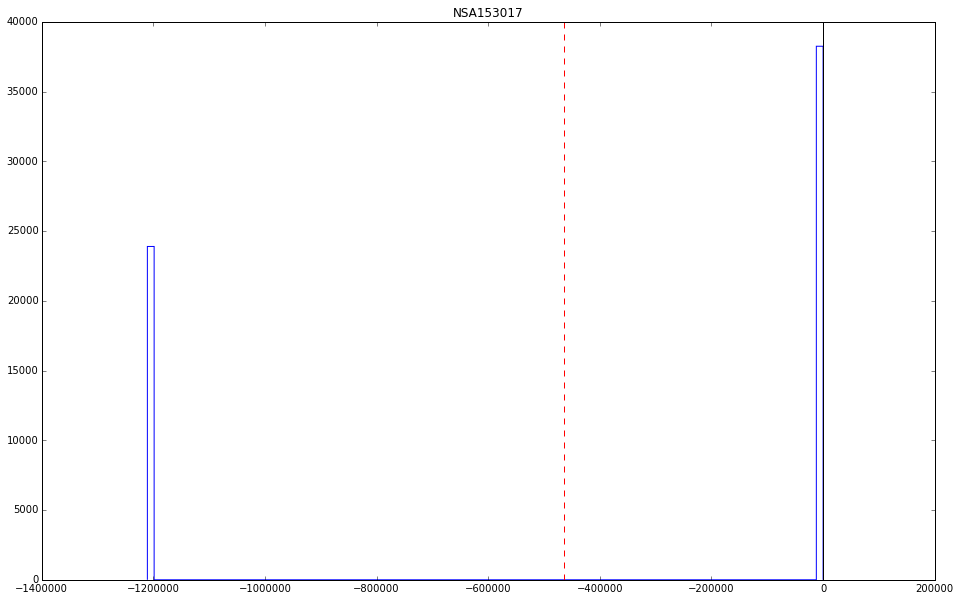

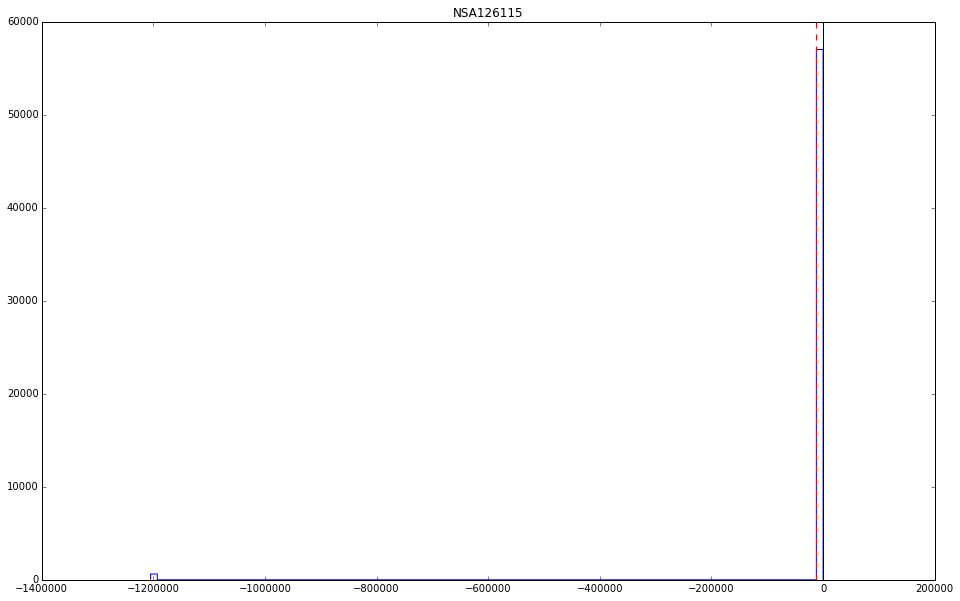

In [22]:
# fix up the rhost columns, which are wrong near the 0-360 boundary
for h in hosts_to_target:
    cat = joined_catalogs[h]
    catsc = SkyCoord(u.Quantity(cat['ra'], u.deg), u.Quantity(cat['dec'], u.deg))

    seps = catsc.separation(h.coords)
    
    
    dsep = seps - u.Quantity(cat['RHOST_ARCM'], u.arcmin)
    if np.abs(np.mean(dsep)) > 1*u.arcsec:
        print('Host', h.name, 'has >10" offsets from calculated and catalog separation. Issues? Showing histogram')
    
        plt.figure()
        plt.hist(dsep.to(u.arcsec), bins=100, histtype='step')
        plt.axvline(0, color='k')
        plt.axvline(np.mean(dsep).to(u.arcsec).value, color='r', ls='--')
        plt.title(h.name)
    joined_catalogs[h]['RHOST_ARCM'][:] = seps.to(u.arcmin).value
    joined_catalogs[h]['RHOST_KPC'][:] = (seps.radian*h.dist).to(u.kpc).value

## No redmapper

In [115]:
# compute ranks, which includes filtering on mag
rankdct = {}
for h in hosts_to_target:
    cat = joined_catalogs[h]
    
    
    highprob = cat[p_column_for_ranking].filled(0) > 0.5
    medprob = (cat[p_column_for_ranking].filled(0) > 0.05) & ~highprob
    lowprob = (cat[p_column_for_ranking].filled(0) > 0.01) & ~highprob & ~medprob
    inside = cat['RHOST_KPC']<300
    
    rankdct[h] = ranks = np.ones(len(cat), dtype=int)*-1 #the -1 will be re-set at the end
    
    # rank 1 reserved for flux stars
    ranks[inside&highprob] = 2
    ranks[~inside&highprob] = 3
    ranks[inside&medprob] = 4
    ranks[~inside&medprob] = 5
    ranks[inside&lowprob] = 6
    ranks[~inside&lowprob] = 7
    
    validtarget = (cat['r'] < 21.5) & (cat['fibermag_r']<23) & (cat['phot_sg']=='GALAXY')
    other = ranks < 0
    colorcutmsk = targeting.colorcut_mask(cat,  targeting.bossanova_color_cuts)
    
    ranks[validtarget&other&colorcutmsk] = 8
    ranks[validtarget&other&~colorcutmsk] = 9
    
#informational
for h, ranks in rankdct.items():
    cat = joined_catalogs[h]
    
    hranks = dict(enumerate(np.bincount(ranks[ranks>-1])))
    del hranks[0]
    del hranks[1]
    hranks[-1] = np.sum(ranks==-1)
    
    print(h.name,'rank counts:', hranks)
    
    nother =  np.sum(ranks==8)
    nprob = np.sum((ranks<8)&(ranks>0))
    nother_obs = 270-np.sum((ranks<8)&(ranks>0)&(cat['RHOST_ARCM']<30))
    print('fraction not "other": {0:.1%}, nprob_obs={1}\n'.format(nprob/(nprob+nother), nother_obs))

NSA153017 rank counts: {2: 1, 3: 0, 4: 7, 5: 4, 6: 45, 7: 36, 8: 9128, 9: 6531, -1: 46391}
fraction not "other": 1.0%, nprob_obs=257

NSA129387 rank counts: {2: 0, 3: 0, 4: 4, 5: 11, 6: 25, 7: 80, 8: 10178, 9: 6188, -1: 53562}
fraction not "other": 1.2%, nprob_obs=237

NSA150307 rank counts: {2: 0, 3: 1, 4: 4, 5: 11, 6: 3, 7: 39, 8: 8331, 9: 5399, -1: 42785}
fraction not "other": 0.7%, nprob_obs=259

NSA150578 rank counts: {2: 1, 3: 1, 4: 3, 5: 12, 6: 40, 7: 148, 8: 7583, 9: 6723, -1: 46127}
fraction not "other": 2.6%, nprob_obs=228

NSA149977 rank counts: {2: 0, 3: 0, 4: 1, 5: 13, 6: 22, 7: 123, 8: 6619, 9: 4629, -1: 51931}
fraction not "other": 2.3%, nprob_obs=239

NSA150887 rank counts: {2: 1, 3: 2, 4: 11, 5: 19, 6: 28, 7: 53, 8: 9592, 9: 7613, -1: 51964}
fraction not "other": 1.2%, nprob_obs=226

NSA126115 rank counts: {2: 0, 3: 0, 4: 5, 5: 17, 6: 14, 7: 42, 8: 8439, 9: 6008, -1: 43115}
fraction not "other": 0.9%, nprob_obs=255

OBrother rank counts: {2: 0, 3: 0, 4: 2, 5: 24, 6: 26

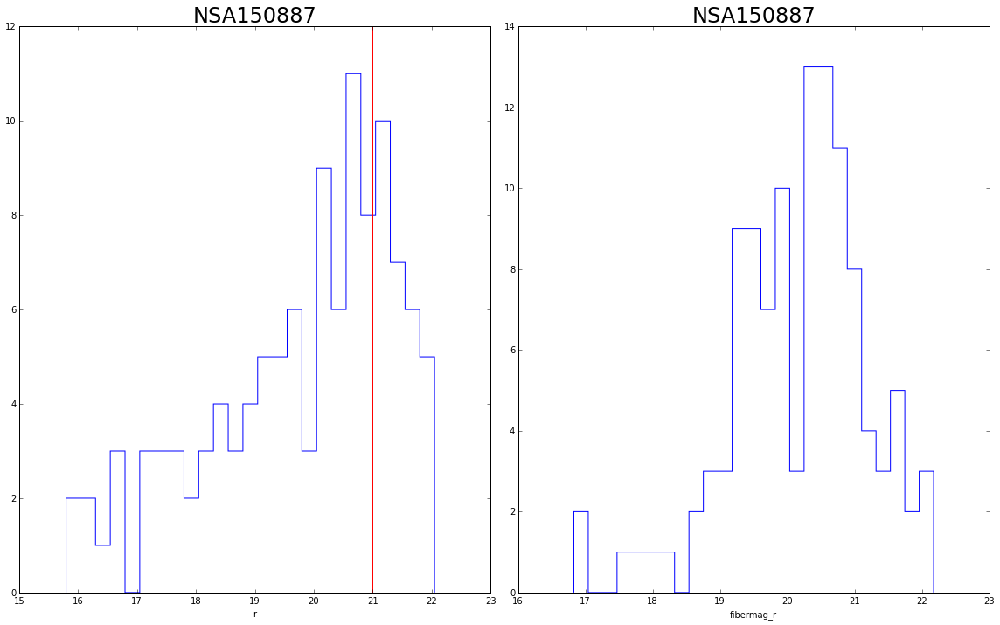

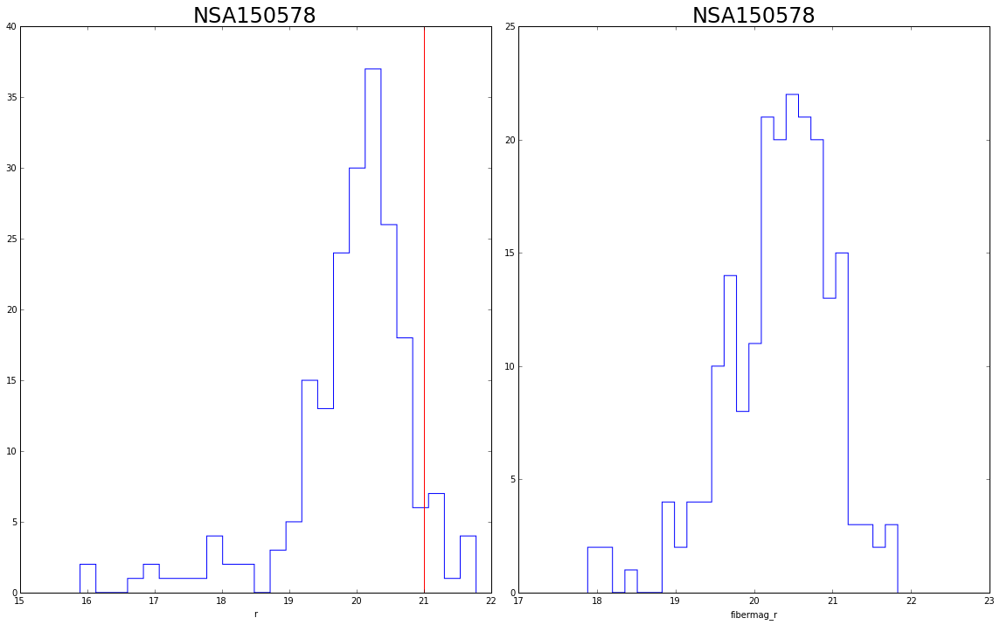

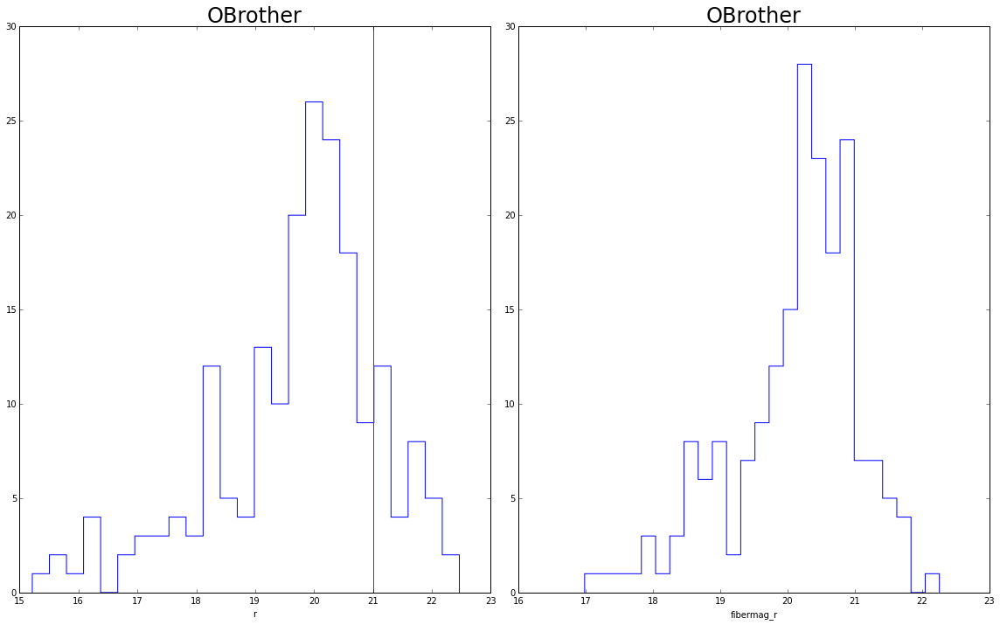

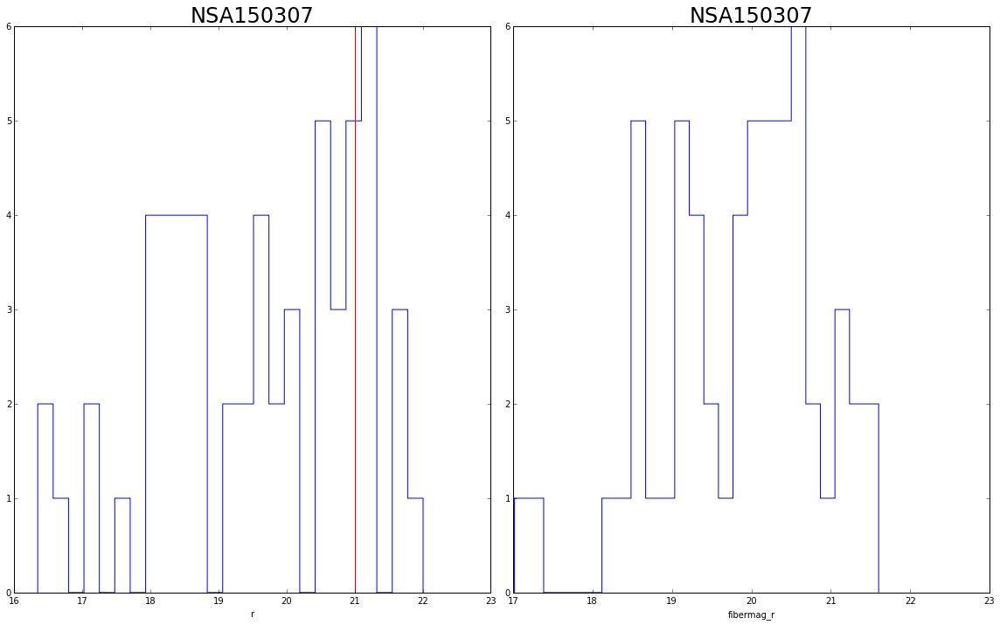

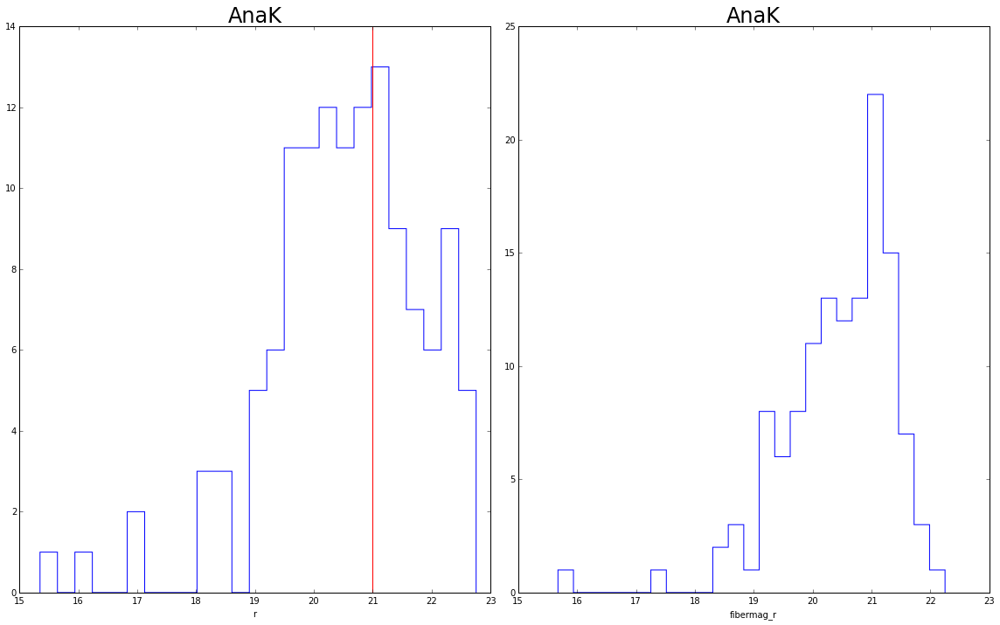

...

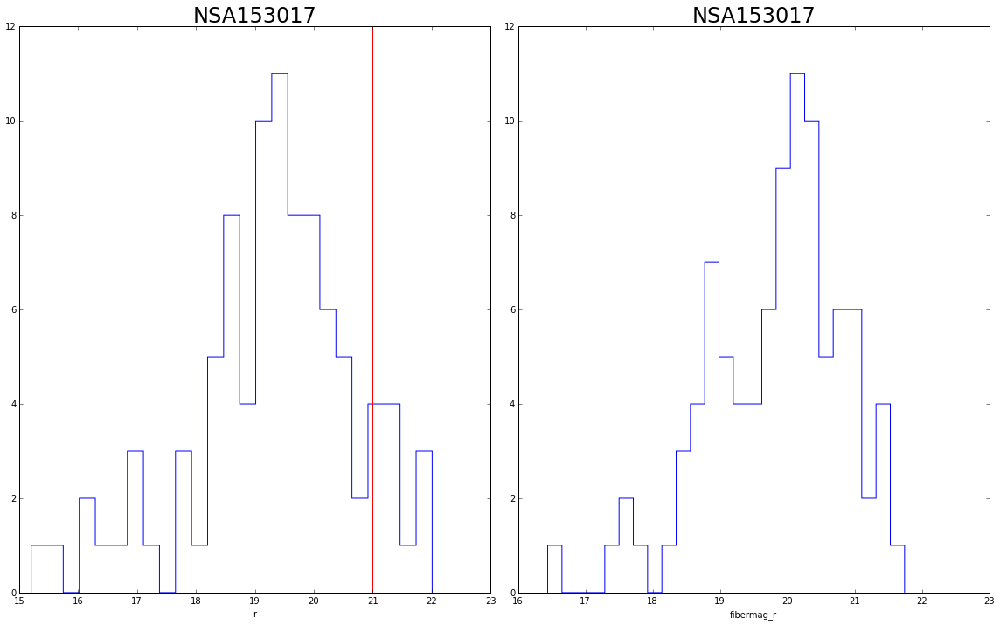

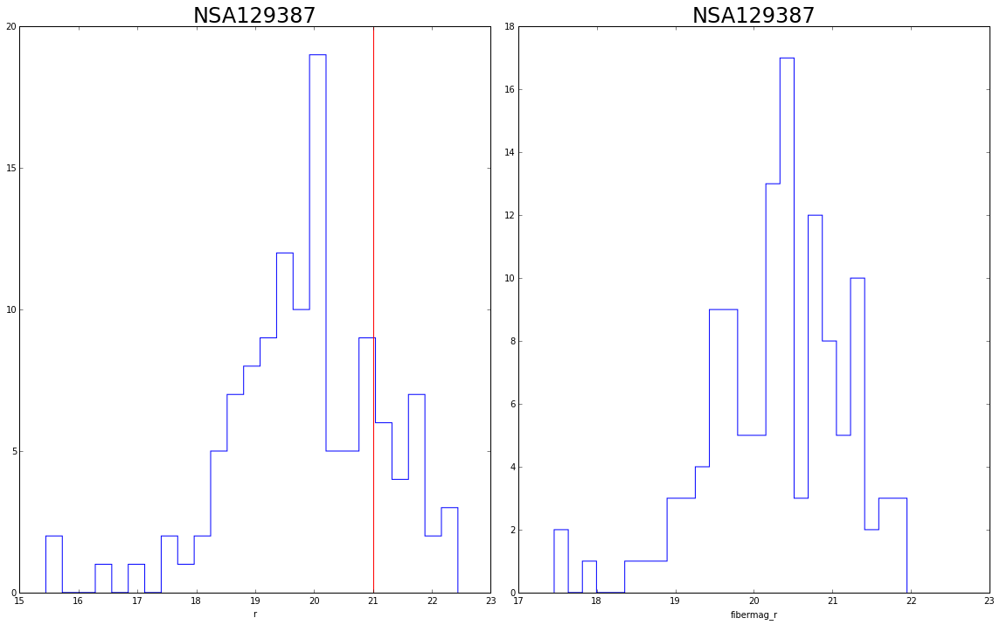

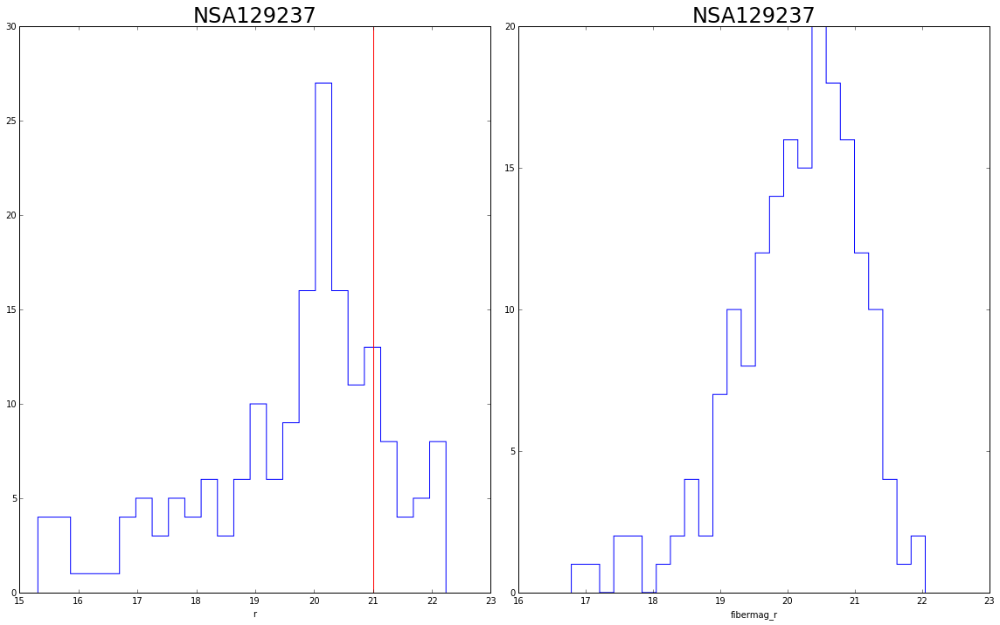

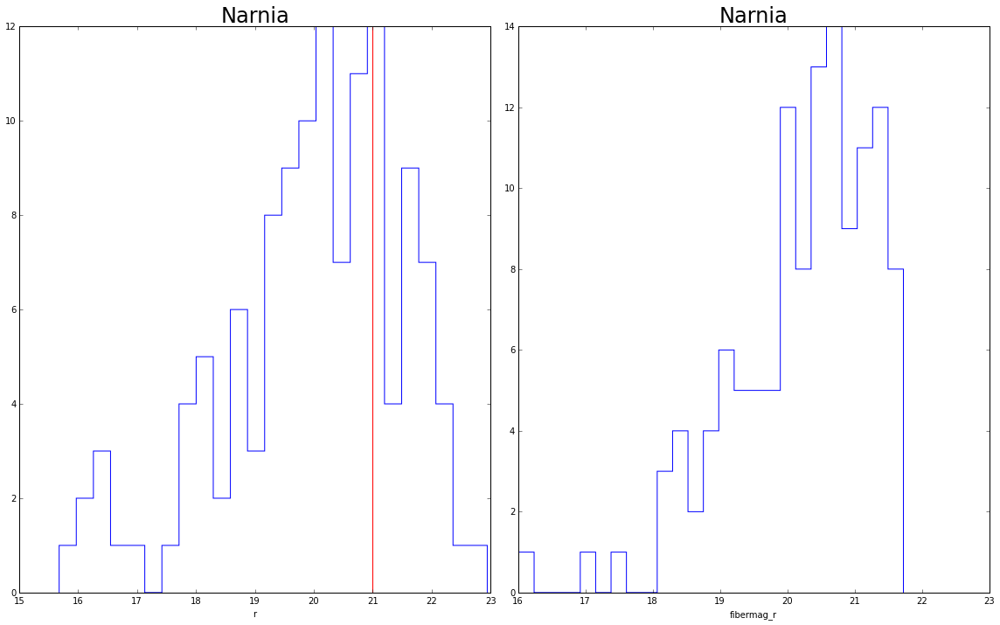

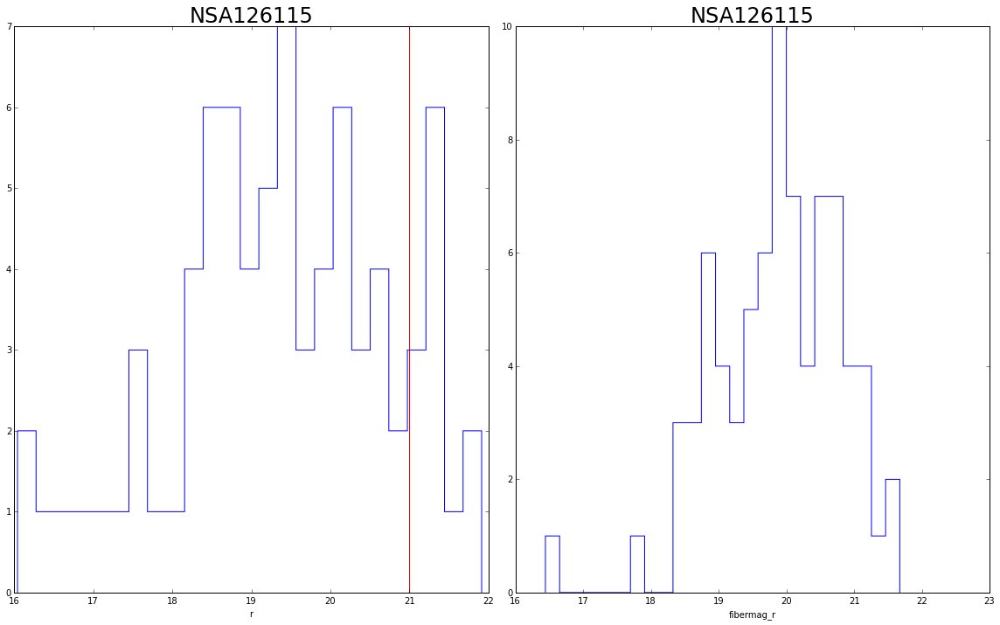

In [116]:
# quick checks: are the ML-selected objects meeting the fibermag and r cuts?
for h in hosts_to_target:
    cat = joined_catalogs[h]
    ranks = rankdct[h]

    plt.figure()
    
    msk = (ranks>0)&(ranks<8)
    plt.subplot(1,2,1)
    plt.hist(cat[msk]['r'],bins=25, histtype='step')
    plt.axvline(21,c='r')
    plt.xlabel('r')
    plt.title(h.name, fontsize=24)
    
    plt.subplot(1,2,2)
    plt.hist(cat[msk]['fibermag_r'],bins=25, histtype='step')
    plt.axvline(23,c='r')
    plt.xlabel('fibermag_r')
    plt.title(h.name, fontsize=24)
    
    plt.tight_layout()

In [117]:
generated_cats = {}
for h in hosts_to_target:
    print('On host', h.name)
    sys.stdout.flush()

    cat = joined_catalogs[h]
    ranks = rankdct[h]
    
    fnout = 'mmthecto/{0}_sep2015.cat'.format(h.name)
    fluxfnout = fnout.replace('.cat', '.fluxstars')
    print('Going to write', fnout)
    
    msk = (cat['RHOST_ARCM']<40) & (ranks>0) & (ranks<9)
    generated_cats[h] = mmthecto.generate_catalog(h, cat[msk], ranks[msk], 
                                         repeatflux=3, removefluxdistance=1*u.arcmin,
                                         fnout=fnout, fluxfnout=fluxfnout)

On host NSA150887
Going to write mmthecto/NSA150887_sep2015.cat
Including 4398 targets
Could not find psf mags so falling back on regular mags...
Found 73 Flux stars
Removing 34 Flux stars too close to program stars
Found 255 guide stars
On host NSA150578
Going to write mmthecto/NSA150578_sep2015.cat
Including 3371 targets
Could not find psf mags so falling back on regular mags...
Found 57 Flux stars
Removing 23 Flux stars too close to program stars
Found 248 guide stars
On host OBrother
Going to write mmthecto/OBrother_sep2015.cat
Including 4301 targets
Could not find psf mags so falling back on regular mags...
Found 110 Flux stars
Removing 47 Flux stars too close to program stars
Found 282 guide stars
On host NSA150307
Going to write mmthecto/NSA150307_sep2015.cat
Including 3595 targets
Could not find psf mags so falling back on regular mags...
Found 99 Flux stars
Removing 32 Flux stars too close to program stars
Found 295 guide stars
On host AnaK
Going to write mmthecto/AnaK_sep2015

## Version including redmapper

In [23]:
redmappertargs = table.Table.read('catalogs/redmagic_targets_0828.fit')
redmappertargs

OBJID,RA,DEC,RMAG
int64,float64,float64,float32
1237678776862507491,348.579777605,4.32783514044,19.8827
1237678776862507396,348.524872272,4.37104962664,20.2401
1237679005021766016,348.408632143,4.48647461874,20.4682
1237679005021766095,348.434188695,4.51415572616,20.0641
1237679005021766194,348.467962826,4.51723020806,19.6637
1237678776862441902,348.375664902,4.30292498984,20.5198
1237679005021700367,348.345592087,4.4104833109,18.9509
1237679005021701029,348.392077147,4.43849219143,19.3736
1237679005021765999,348.407858965,4.41972791471,19.4642


In [24]:
# sanity checks to make sure redmapper targets are in the catalog 
rmscs = SkyCoord(redmappertargs['RA']*u.deg, redmappertargs['DEC']*u.deg)

for h in hosts_to_target:
    jcat = joined_catalogs[h]
    rmhs = redmappertargs[rmscs.separation(h.coords)<2*u.deg]
    
    incat = np.in1d(rmhs['OBJID'], jcat['objID'])
    print(h.name, np.sum(incat), np.sum(~incat))
    
    incat2 = np.in1d(rmhs['OBJID'], h.get_sdss_catalog()['objID'])
    print(np.sum(incat2), np.sum(~incat2))
    
    catinrmmsk = np.in1d(jcat['objID'], redmappertargs['OBJID'])
    print(np.sum(catinrmmsk), np.sum(~catinrmmsk))

NSA150887 94 0
94 0
94 69189
NSA150578 47 1
47 1
47 60591
OBrother 66 2
68 0
66 79181
NSA150307 24 0
24 0
24 56549
AnaK 75 1
75 1
75 76353
NSA149977 38 0
38 0
38 63300
NSA153017 66 69
66 69
66 62077
NSA129387 49 0
49 0
49 69999
NSA129237 36 0
36 0
36 58118
Narnia 63 0
63 0
63 73472
NSA126115 62 73
62 73
62 57578


In [25]:
# compute ranks, which includes filtering on mag
rankdct = {}
for h in hosts_to_target:
    cat = joined_catalogs[h]
    
    highprob = cat[p_column_for_ranking].filled(0) > 0.5
    medprob = (cat[p_column_for_ranking].filled(0) > 0.05) & ~highprob
    lowprob = (cat[p_column_for_ranking].filled(0) > 0.01) & ~highprob & ~medprob
    inside = cat['RHOST_KPC']<300
    
    rankdct[h] = ranks = np.ones(len(cat), dtype=int)*-1 #the -1 will be re-set at the end
    
    # rank 1 reserved for flux stars
    ranks[inside&highprob] = 2
    ranks[~inside&highprob] = 3
    ranks[inside&medprob] = 4
    ranks[~inside&medprob] = 5
    ranks[inside&lowprob] = 6
    ranks[~inside&lowprob] = 7
    
    validtarget = (cat['r'] < 21.5) & (cat['fibermag_r']<23) & (cat['phot_sg']=='GALAXY')
    other = ranks < 0
    colorcutmsk = targeting.colorcut_mask(cat,  targeting.bossanova_color_cuts)
    
    ranks[validtarget&other&colorcutmsk] = 9
    ranks[validtarget&other&~colorcutmsk] = 10
    redmappertarg = np.in1d(cat['objID'], redmappertargs['OBJID'])
    rg7 = ranks>7
    ranks[validtarget&redmappertarg&rg7] = 8
    
#informational
for h, ranks in rankdct.items():
    cat = joined_catalogs[h]
    
    hranks = dict(enumerate(np.bincount(ranks[ranks>-1])))
    del hranks[0]
    del hranks[1]
    hranks[-1] = np.sum(ranks==-1)
    
    print(h.name,'rank counts:', hranks)
    
    nother =  np.sum(ranks==8)
    nprob = np.sum((ranks<8)&(ranks>0))
    nother_obs = 270-np.sum((ranks<8)&(ranks>0)&(cat['RHOST_ARCM']<30))
    print('fraction not "other": {0:.1%}, nprob_obs={1}\n'.format(nprob/(nprob+nother), nother_obs))

OBrother rank counts: {2: 0, 3: 0, 4: 3, 5: 23, 6: 26, 7: 143, 8: 66, 9: 9288, 10: 6150, -1: 63548}
fraction not "other": 74.7%, nprob_obs=233

NSA150307 rank counts: {2: 0, 3: 1, 4: 4, 5: 11, 6: 3, 7: 39, 8: 24, 9: 8331, 10: 5375, -1: 42785}
fraction not "other": 70.7%, nprob_obs=259

NSA126115 rank counts: {2: 0, 3: 0, 4: 5, 5: 17, 6: 13, 7: 43, 8: 62, 9: 8439, 10: 5946, -1: 43115}
fraction not "other": 55.7%, nprob_obs=255

Narnia rank counts: {2: 0, 3: 0, 4: 3, 5: 36, 6: 13, 7: 72, 8: 63, 9: 10958, 10: 5847, -1: 56543}
fraction not "other": 66.3%, nprob_obs=251

NSA153017 rank counts: {2: 1, 3: 0, 4: 1, 5: 10, 6: 20, 7: 61, 8: 66, 9: 9128, 10: 6465, -1: 46391}
fraction not "other": 58.5%, nprob_obs=248

NSA150578 rank counts: {2: 1, 3: 1, 4: 3, 5: 12, 6: 41, 7: 147, 8: 46, 9: 7583, 10: 6677, -1: 46127}
fraction not "other": 81.7%, nprob_obs=228

NSA129387 rank counts: {2: 0, 3: 0, 4: 4, 5: 11, 6: 25, 7: 80, 8: 49, 9: 10178, 10: 6139, -1: 53562}
fraction not "other": 71.0%, nprob_ob

In [36]:
hh.coords.ra.deg

359.8562751500014

In [28]:
generated_cats = {}
for h in hosts_to_target:
    print('On host', h.name)
    sys.stdout.flush()

    cat = joined_catalogs[h]
    ranks = rankdct[h]
    
    def names_from_suffix(suffix, verbose=True):
        fnout = 'mmthecto/{0}_{1}.cat'.format(h.name, suffix)
        fluxfnout = fnout.replace('.cat', '.fluxstars')
        if verbose:
            print('Going to write', fnout, fluxfnout)
        return fnout, fluxfnout
    
    fnout, fluxfnout = names_from_suffix('sep2015_w_redmapper')
    msk = (cat['RHOST_ARCM']<40) & (ranks>0) & (ranks<10)
    generated_cats[h] = gcat = mmthecto.generate_catalog(h, cat[msk], ranks[msk], 
                                         repeatflux=3, removefluxdistance=20*u.arcsec,
                                         fnout=fnout, fluxfnout=fluxfnout)
    
    check_msk = (gcat['type'] == 'TARGET')&(gcat['rank']=='8')&(gcat['object']!='qso_candidate')
    gids = np.array(gcat[check_msk]['object']).astype(int)
    print('Check: N in redmapper:', np.sum(np.in1d(gids, redmappertargs['OBJID'])), 'out of n that are rank 8:', len(gids))
    print('')
    
    #these can be used to apply fibermag cuts... but at least when last run *all* of the high-p object already meet the cut
    #fnout, fluxfnout = names_from_suffix('sep2015_w_redmapper_fibermag22p5')
    #brightfibmag = cat['fibermag_r']<22.5
    #print('fibermag<22.5 cut removes', np.sum((1<ranks)&(ranks<8)&msk&~brightfibmag), 'of', np.sum((1<ranks)&(ranks<8)&msk))
    #generated_cats[h] = gids = mmthecto.generate_catalog(h, cat[msk&brightfibmag], ranks[msk&brightfibmag], 
    #                                     repeatflux=3, removefluxdistance=20*u.arcsec,
    #                                     fnout=fnout, fluxfnout=fluxfnout)
    
    #fnout, fluxfnout = names_from_suffix('sep2015_w_redmapper_fibermag23')
    #brightfibmag = cat['fibermag_r']<23
    #print('fibermag<23 cut removes', np.sum((1<ranks)&(ranks<8)&msk&~brightfibmag), 'of', np.sum((1<ranks)&(ranks<8)&msk))
    #generated_cats[h] = gids = mmthecto.generate_catalog(h, cat[msk&brightfibmag], ranks[msk&brightfibmag], 
    #                                     repeatflux=3, removefluxdistance=20*u.arcsec,
    #                                     fnout=fnout, fluxfnout=fluxfnout)

skipping NSA150887
skipping NSA150578
skipping OBrother
skipping NSA150307
skipping AnaK
skipping NSA149977
On host NSA153017
Going to write mmthecto/NSA153017_sep2015_w_redmapper.cat mmthecto/NSA153017_sep2015_w_redmapper.fluxstars
Including 4167 targets
Found 64 Flux stars
Removing 6 Flux stars too close to program stars
Could not find psf mags so falling back on regular mags...
Found 292 guide stars
Check: N in redmapper: 19 out of n that are rank 8: 19

skipping NSA129387
skipping NSA129237
skipping Narnia
skipping NSA126115


In [435]:
#now *just* for AnaK we manually insert a line for the high-Z QSO candidate and the decals LSB
print(SkyCoord(354.42221684 *u.deg, 0.22783437*u.deg).to_string('hmsdms',sep=':'))
linestoadd = ['23:37:41.332\t0:13:40.204\tqso_candidate\t7\tTARGET\t21.89', 
              '23:37:07.90\t0:12:40.86\tDECALS_target_1\t2\tTARGET\t21.3']

anakfns = !ls mmthecto/AnaK_sep2015_w_redmapper*.cat
for catfn in anakfns:
    print('Adding to', catfn)
    lines = []
    with open(catfn) as f:
        for l in f:
            lines.append(l)
    with open(catfn, 'w') as f:
        for l in lines:
            f.write(l)
        for linetoadd in linestoadd:
            f.write('\n')
            f.write(linetoadd)

23:37:41.332 +00:13:40.2037
Adding to mmthecto/AnaK_sep2015_w_redmapper.cat
Adding to mmthecto/AnaK_sep2015_w_redmapper_fibermag22p5.cat
Adding to mmthecto/AnaK_sep2015_w_redmapper_fibermag23.cat


## Checking outputs

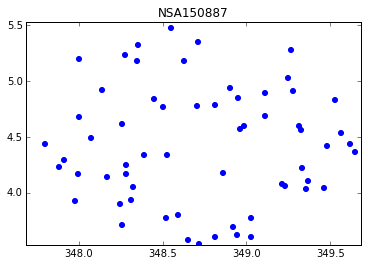

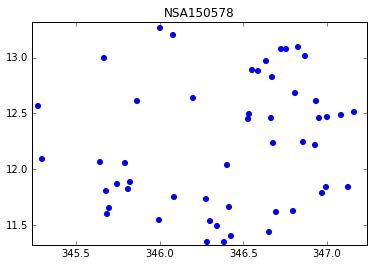

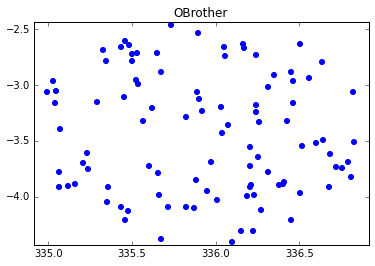

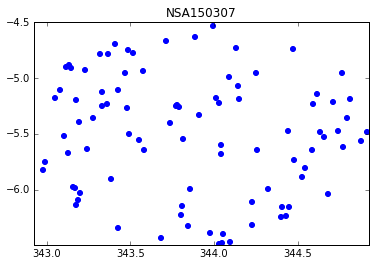

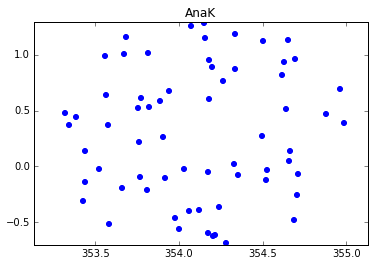

...

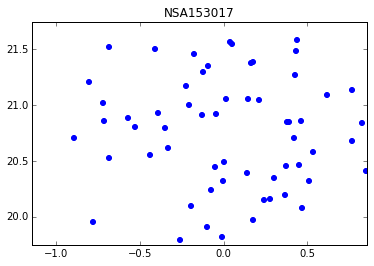

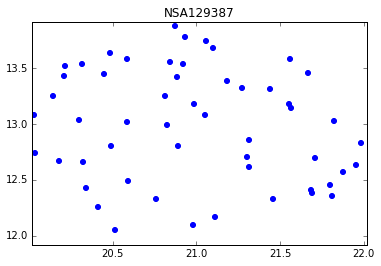

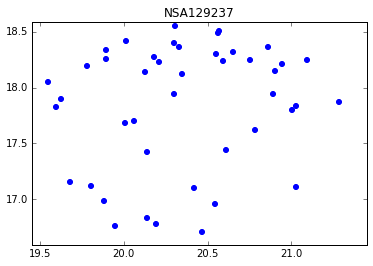

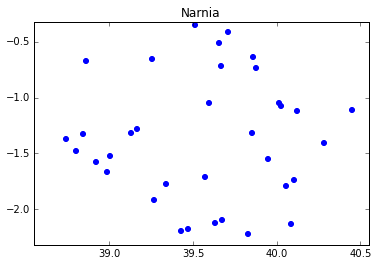

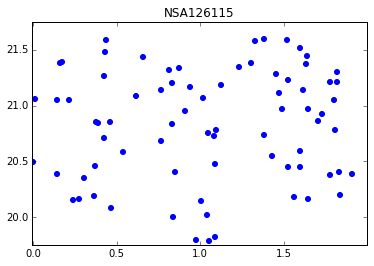

In [399]:
for h in hosts_to_target:
    gc = generated_cats[h]

    fixrank = []
    for r in gc['rank']:
        try:
            fixrank.append(int(r))
        except ValueError:
            fixrank.append(-2)
    fixrank = np.array(fixrank)

    msk = fixrank==1#(fixrank>1)&(fixrank<8)

    #targeting.sampled_imagelist(gc['ra'][msk], gc['dec'][msk], names=gc['rank'][msk],n=200)
    
    wrapat = 180*u.deg if h.ra>358 else 360*u.deg

    plt.figure()
    plt.scatter(Angle(gc['ra'][msk], u.deg).wrap_at(wrapat).deg, gc['dec'][msk], color='b')
    plt.xlim(h.coords.ra.wrap_at(wrapat).deg-1, h.coords.ra.wrap_at(wrapat).deg+1)
    plt.ylim(h.coords.dec.deg-1, h.coords.dec.deg+1)
    plt.title(h.name)

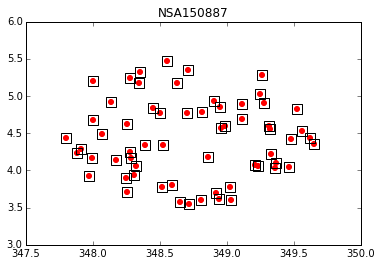

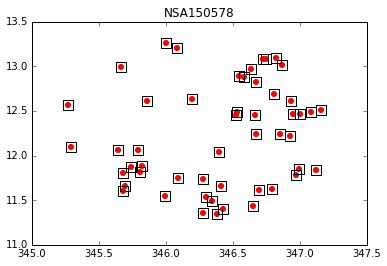

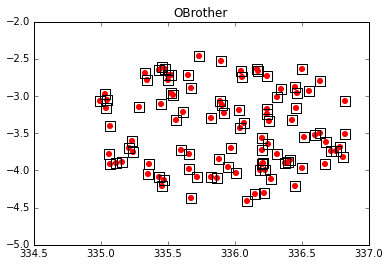

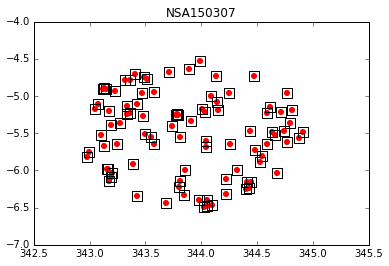

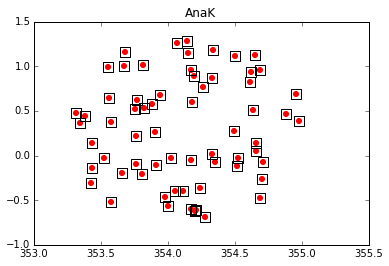

...

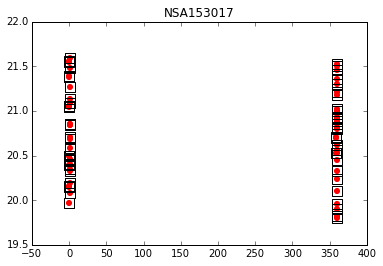

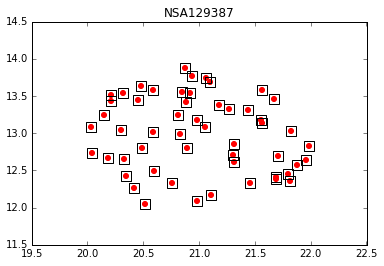

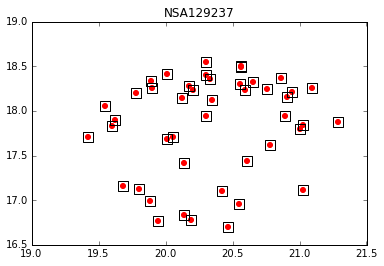

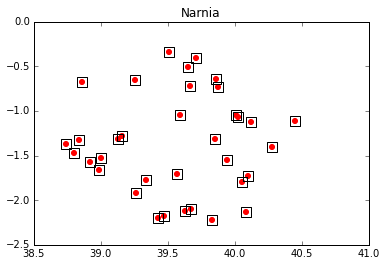

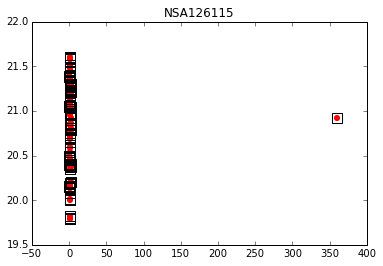

In [400]:
for h in hosts_to_target:
    fnout = 'mmthecto/{0}_sep2015_w_redmapper.cat'.format(h.name)
    fluxfnout = fnout.replace('.cat', '.fluxstars')
    cattab = Table.read(fnout, format='ascii',data_start=2)
    fxtab = Table.read(fluxfnout, format='ascii')
    
    catsc = SkyCoord(Longitude(cattab['ra'], u.hourangle), Latitude(cattab['dec'], u.deg))
    fxsc = SkyCoord(fxtab['RA']*u.deg, fxtab['DEC']*u.deg)
    catfx = catsc[cattab['rank']==1]
    
    plt.figure()
    plt.title(h.name)
    plt.scatter(catfx.ra.deg, catfx.dec.deg, color='r') #in the catalog
    plt.scatter(fxsc.ra.deg, fxsc.dec.deg, edgecolor='k', facecolor='none', marker='s',s=100)

In [401]:
for h in hosts_to_target:
    fnout = 'mmthecto/{0}_sep2015_w_redmapper.cat'.format(h.name)
    cattab = Table.read(fnout, format='ascii',data_start=2)
    
    msk = (cattab['type'] == 'TARGET')&(cattab['rank']>1)&(cattab['rank']<10)&(cattab['object']!='qso_candidate')
    ids = np.array(cattab[msk]['object']).astype(int)
    
    print('n w/id in redmagic:', np.sum(np.in1d(ids, redmappertargs['OBJID'])), 
          'of', np.sum(cattab['rank']==8), 'rank 8 objects')

n w/id in redmagic: 94 of 94 rank 8 objects
n w/id in redmagic: 46 of 46 rank 8 objects
n w/id in redmagic: 66 of 66 rank 8 objects
n w/id in redmagic: 24 of 24 rank 8 objects
n w/id in redmagic: 75 of 75 rank 8 objects
n w/id in redmagic: 38 of 38 rank 8 objects
n w/id in redmagic: 10 of 10 rank 8 objects
n w/id in redmagic: 49 of 49 rank 8 objects
n w/id in redmagic: 35 of 35 rank 8 objects
n w/id in redmagic: 63 of 63 rank 8 objects
n w/id in redmagic: 50 of 50 rank 8 objects


In [440]:
for h in hosts_to_target:
    fnout = 'mmthecto/{0}_sep2015_w_redmapper.cat'.format(h.name)
    cattab = Table.read(fnout, format='ascii',data_start=2)
    
    msk = (cattab['type'] == 'TARGET')&(cattab['rank']>1)&(cattab['rank']<10)&(cattab['object']!='qso_candidate')
    ids = np.array(cattab[msk]['object']).astype(int)
    scat = h.get_sdss_catalog()
    jcat = joined_catalogs[h]
    
    scatincat = scat[np.in1d(scat['objID'], ids)]
    jcatincat = jcat[np.in1d(jcat['objID'], ids)]
    print(h.name)
    print('targs w/ zqal>2:', np.sum(scatincat['ZQUALITY']>2), 'of', len(scatincat))
    print('targs w/ remove!=-1:', np.sum(scatincat['REMOVE']!=-1), 'of', len(scatincat))
    print('targs w/ fibermag>22.5', np.sum(scatincat['fibermag_r']>22.5), 'of', len(scatincat))
    goodp = jcatincat[p_column_for_ranking]>0.01
    print('high-p targs w/ fibermag>22.5', np.sum((jcatincat['fibermag_r']>22.5)&goodp), 'of', np.sum(goodp))
    #scatincat[scatincat['ZQUALITY']>2].show_in_browser()

NSA150887
targs w/ zqal>2: 0 of 4492
targs w/ remove!=-1: 0 of 4492
targs w/ fibermag>22.5 121 of 4492
high-p targs w/ fibermag>22.5 0 of 65
NSA150578
targs w/ zqal>2: 0 of 3417
targs w/ remove!=-1: 0 of 3417
targs w/ fibermag>22.5 60 of 3417
high-p targs w/ fibermag>22.5 0 of 77
OBrother
targs w/ zqal>2: 0 of 4367
targs w/ remove!=-1: 0 of 4367
targs w/ fibermag>22.5 105 of 4367
high-p targs w/ fibermag>22.5 0 of 74
NSA150307
targs w/ zqal>2: 0 of 3619
targs w/ remove!=-1: 0 of 3619
targs w/ fibermag>22.5 81 of 3619
high-p targs w/ fibermag>22.5 0 of 20
AnaK
targs w/ zqal>2: 0 of 4714
targs w/ remove!=-1: 0 of 4714
targs w/ fibermag>22.5 109 of 4714
high-p targs w/ fibermag>22.5 0 of 39
NSA149977
targs w/ zqal>2: 0 of 3031
targs w/ remove!=-1: 0 of 3031
targs w/ fibermag>22.5 66 of 3031
high-p targs w/ fibermag>22.5 0 of 65
NSA153017
targs w/ zqal>2: 0 of 2586
targs w/ remove!=-1: 0 of 2586
targs w/ fibermag>22.5 46 of 2586
high-p targs w/ fibermag>22.5 0 of 24
NSA129387
targs w/ zqal

#Test rounds 

In [70]:
mlpred = Table.read('catalogs/SAGAobjid_Prediction_SDSSwise_gt0.txt.fits.gz')
objids = mlpred['OBJID'].astype(int)
mlpred.remove_column('OBJID')
mlpred.add_column(table.Column(name='objID', data=objids), index=0)
mlpred

objID,RA,DEC,DERED_R,PROBABILITY_CLASS_1,BEST_GUESS_CLASS
int64,float32,float32,float32,float32,int32
1237661417677586534,219.71,52.2726,15.2003,0.998771,1
1237661957760614535,210.936,48.7663,16.1211,0.998764,1
1237665566078402826,233.787,16.871,15.6201,0.998218,1
1237661357002719237,168.923,46.1285,15.8287,0.99738,1
1237664667899723842,159.073,36.4253,16.4519,0.997259,1
1237661435925692576,207.521,46.4504,16.3728,0.997126,1
1237659326017831104,216.148,56.2494,16.4042,0.996922,1
1237660635462369383,168.603,46.1325,16.1745,0.996618,1
1237663277925204111,354.195,0.623404,15.9147,0.996415,1


In [74]:
joined_catalogs = {}
for h in candhosts:
    joined_catalogs[h] = table.join(h.get_sdss_catalog(), mlpred, join_type='left', keys='objID')

## Try actually constructing catalogs for use with hectospec

In [184]:
rankdct = {}
for h in candhosts:
    print('On host', h.name)
    sys.stdout.flush()
    
    cat = joined_catalogs[h]
    highprob = cat['PROBABILITY_CLASS_1'].filled(0) > 0.3
    medprob = (cat['PROBABILITY_CLASS_1'].filled(0) > 0.05) & ~highprob
    inside = cat['RHOST_KPC']<300
    
    rankdct[h] = ranks = np.ones(len(cat))*6 # all not set below are 5
    ranks[~inside] = 5 #up-weight those inside
    ranks[highprob&inside] = 1
    ranks[medprob&inside] = 2
    ranks[highprob&~inside] = 3
    ranks[medprob&~inside] = 4
    
    fnout = 'mmthecto/{0}_sep2015_test.cat'.format(h.name)
    fluxfnout = fnout.replace('.cat', '.fluxstars')
    print('Going to write', fnout)
    
    msk = ranks<5
    stoutcat = mmthecto.generate_catalog(h, cat[msk], ranks[msk]+1, 
                                         repeatflux=5, removefluxdistance=1*u.arcmin,
                                         fnout=fnout)#, fluxfnout=fluxfnout)

On host NSA150887
Going to write mmthecto/NSA150887_sep2015_test.cat
Including 137 targets
Found 73 Flux stars
Removing 2 Flux stars too close to program stars
Found 255 guide stars
On host NSA150578
Going to write mmthecto/NSA150578_sep2015_test.cat
Including 125 targets
Found 57 Flux stars
Removing 3 Flux stars too close to program stars
Found 248 guide stars
On host OBrother
Going to write mmthecto/OBrother_sep2015_test.cat
Including 168 targets
Found 110 Flux stars
Removing 1 Flux stars too close to program stars
Found 282 guide stars
On host NSA150307
Going to write mmthecto/NSA150307_sep2015_test.cat
Including 75 targets
Found 99 Flux stars
Removing 2 Flux stars too close to program stars
Found 295 guide stars
On host AnaK
Going to write mmthecto/AnaK_sep2015_test.cat
Including 221 targets
Found 79 Flux stars
Removing 6 Flux stars too close to program stars
Found 72 guide stars
On host NSA149977
Going to write mmthecto/NSA149977_sep2015_test.cat
Including 108 targets
Found 128 Fl

## Experiments 

In [164]:
from matplotlib import patches

def scplot(sc, **kwargs):
    x = sc.ra.wrap_at(180*u.deg).deg
    y = sc.dec
    kwargs.setdefault('edgecolor', 'none')
    kwargs.setdefault('s', 5)
    kwargs.setdefault('alpha', .5)
    return plt.scatter(x, y, **kwargs)

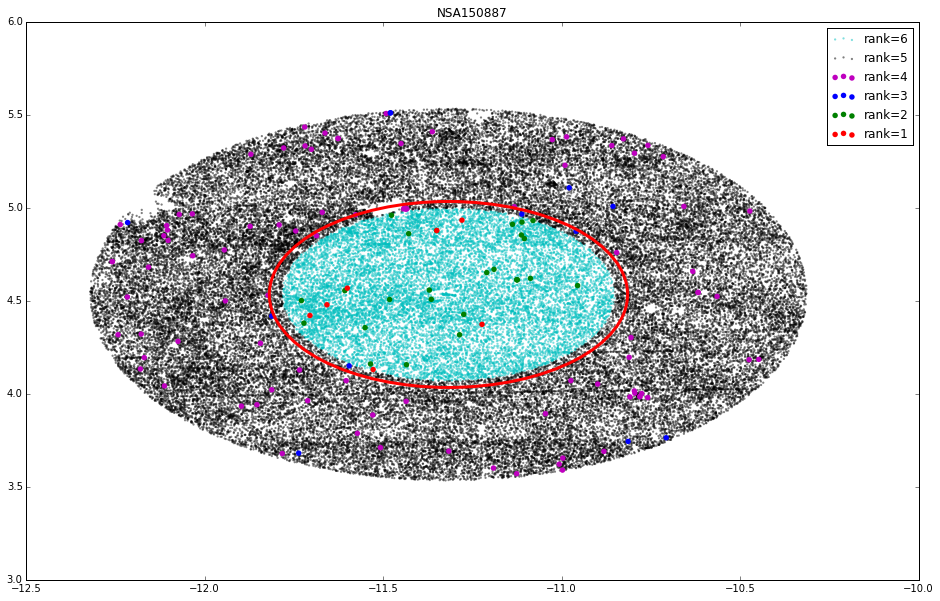

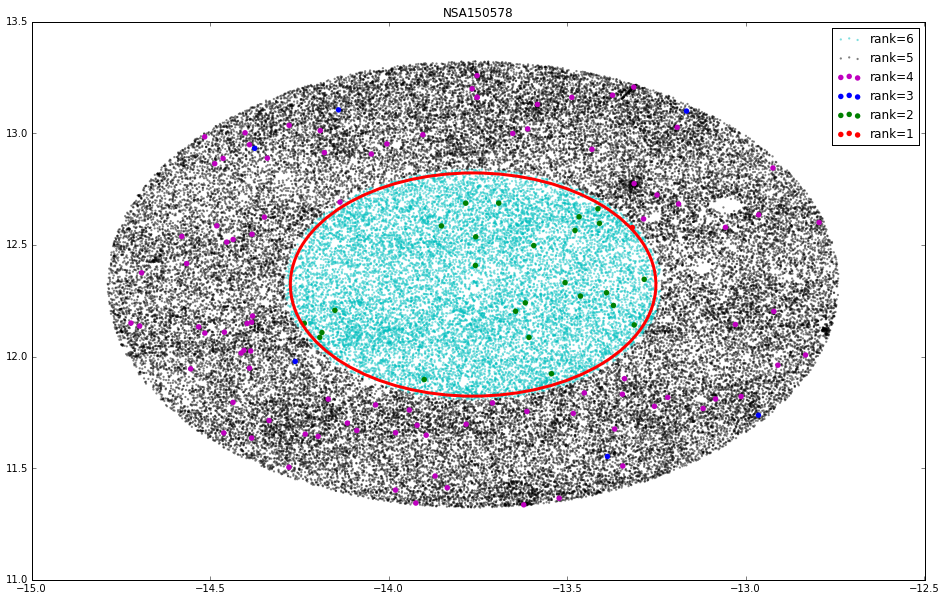

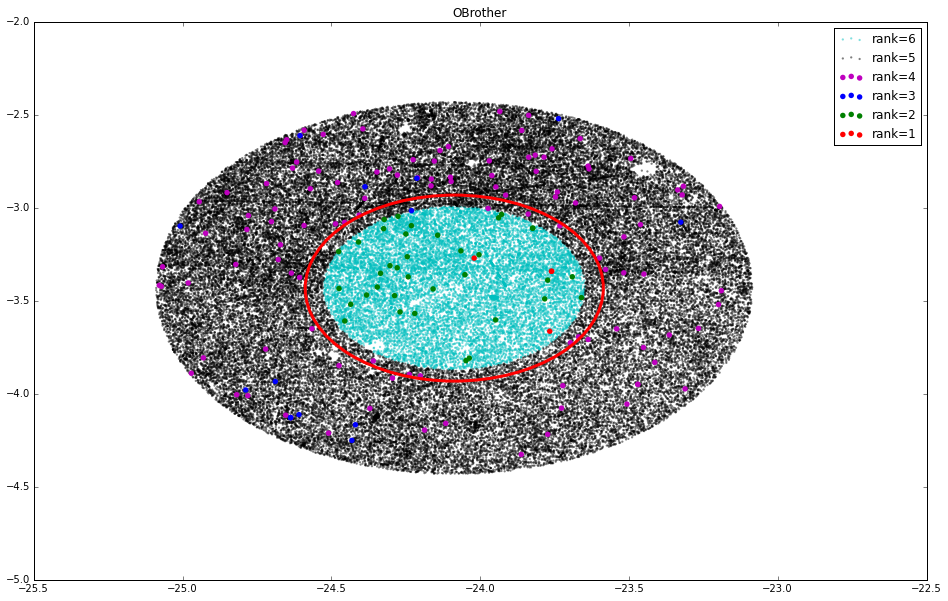

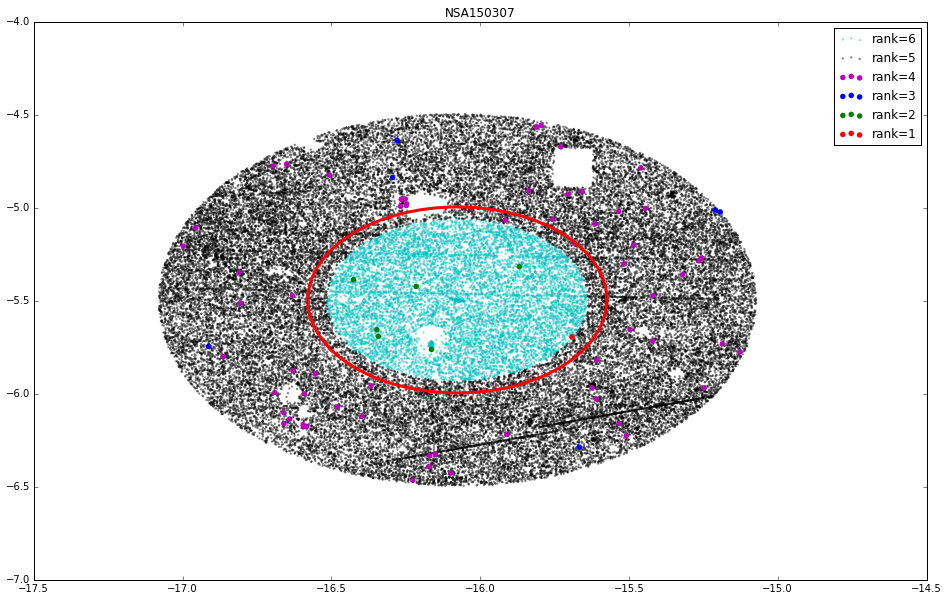

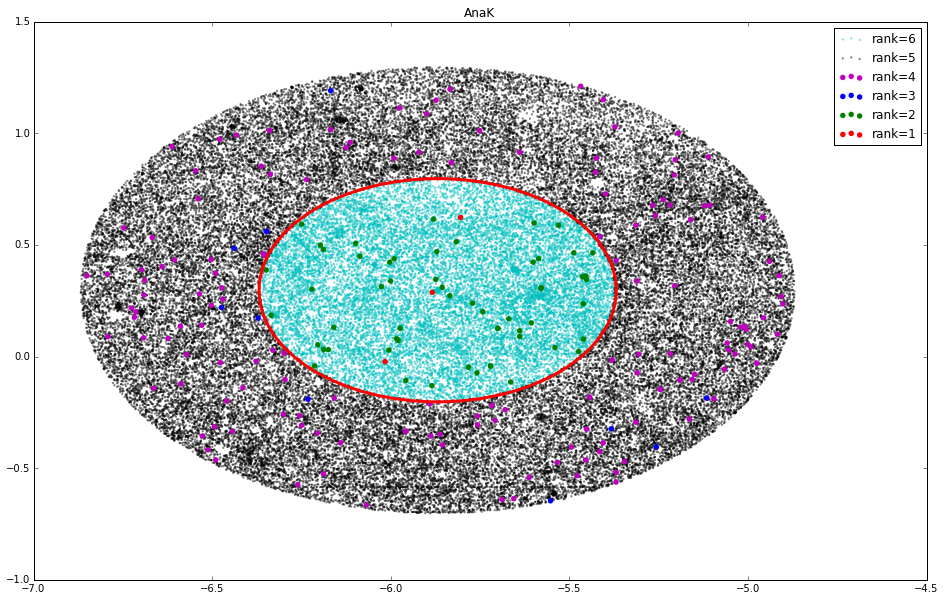

...

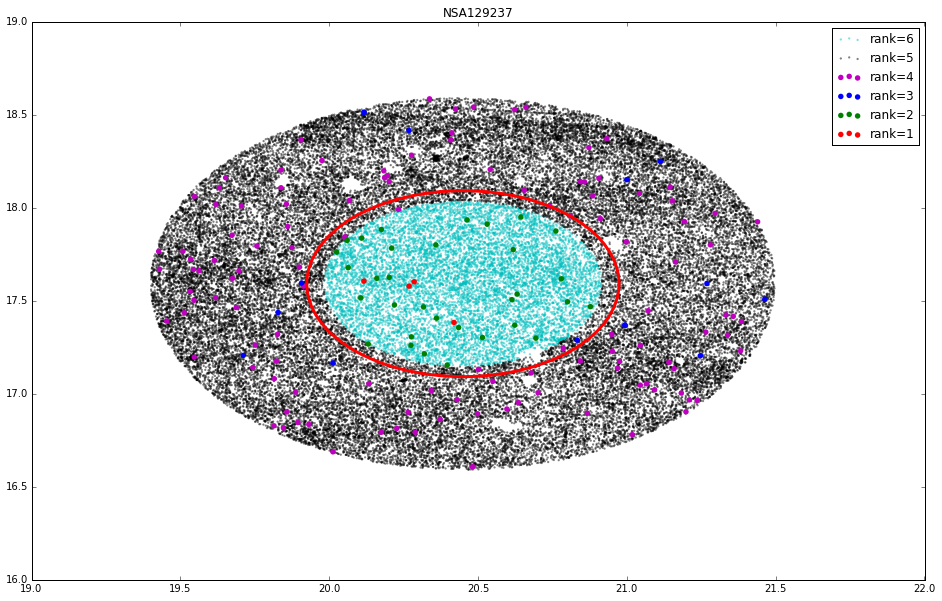

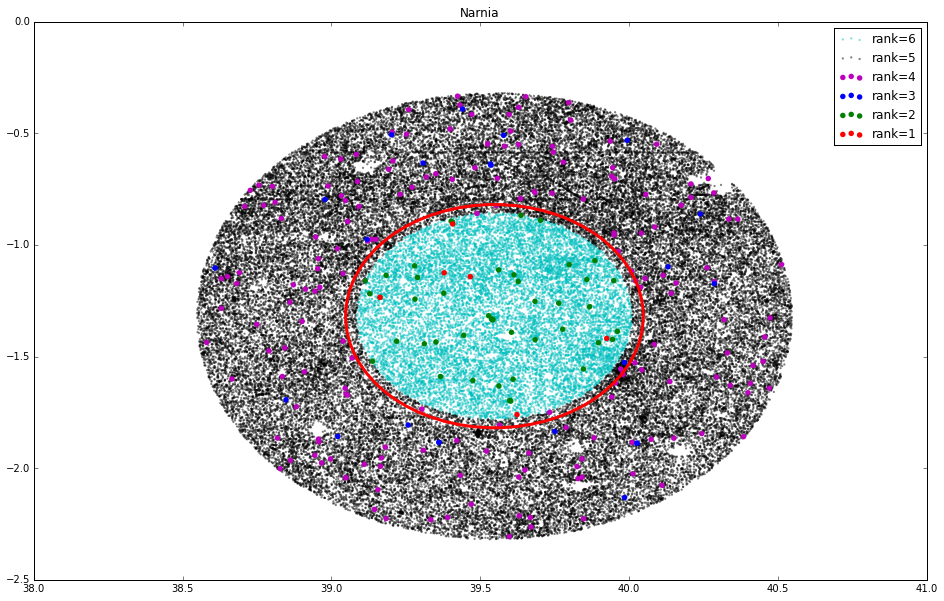

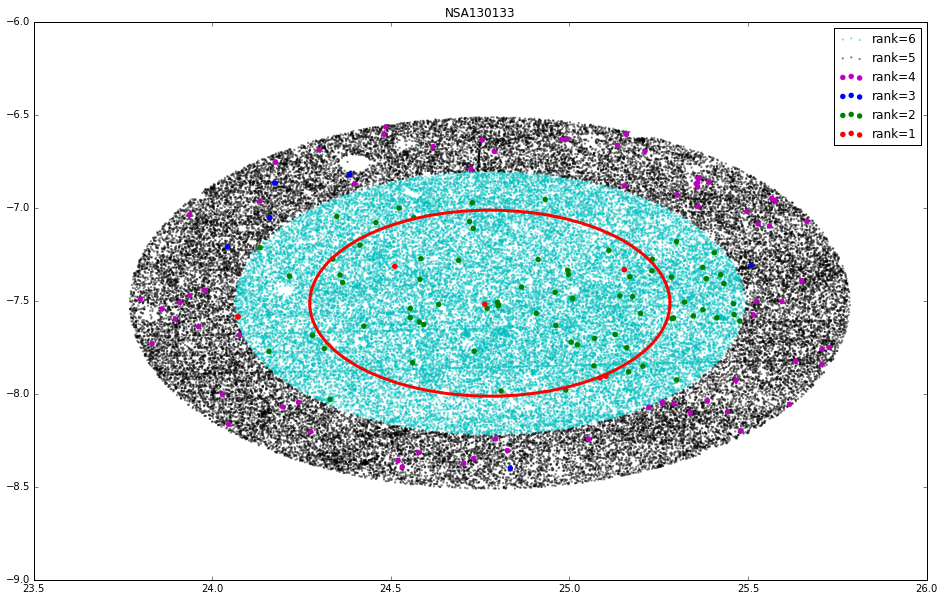

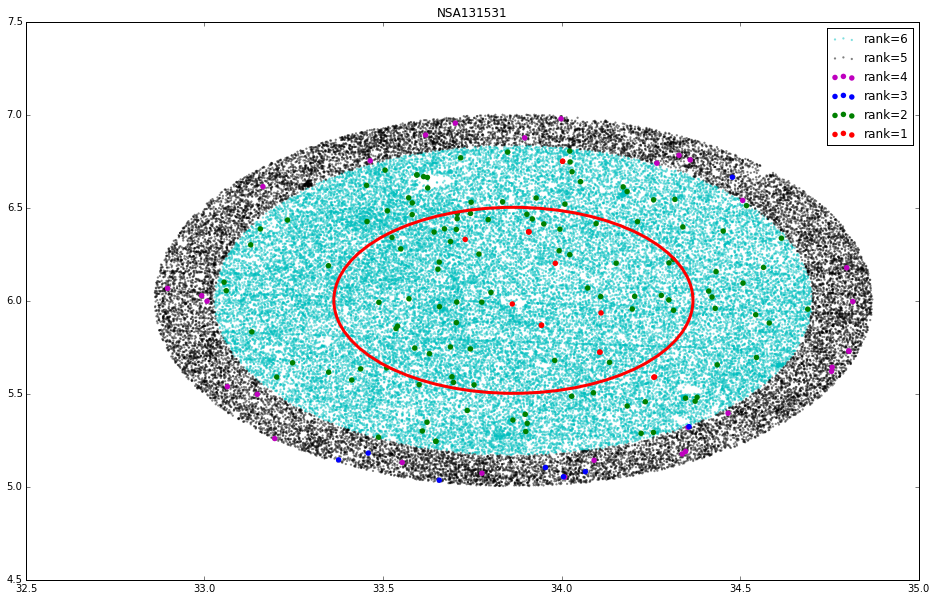

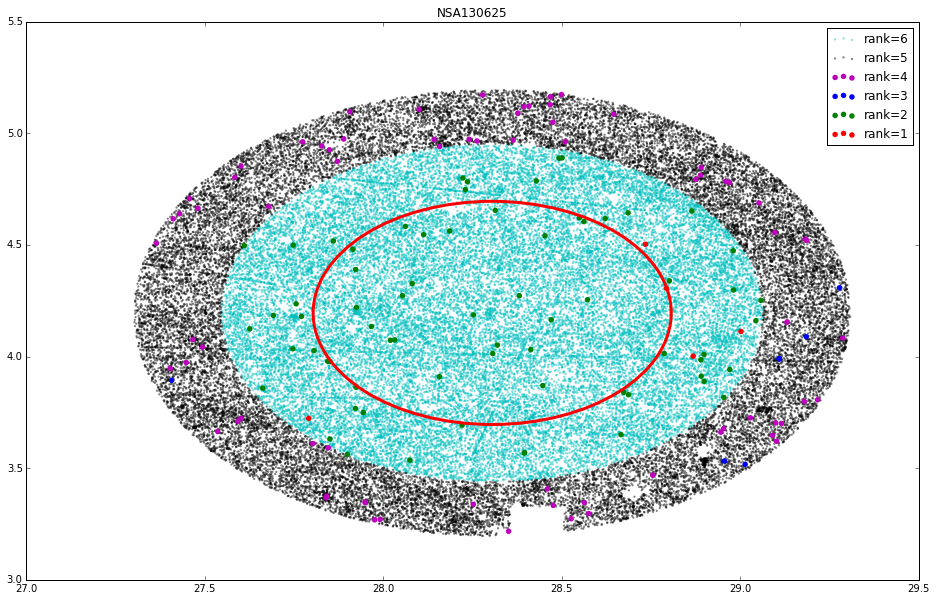

In [176]:
for i, h in enumerate(candhosts):    
    cat = joined_catalogs[h]
    sc =  SkyCoord(u.Quantity(cat['ra'], u.deg), u.Quantity(cat['dec'], u.deg))
    
    highprob = cat['PROBABILITY_CLASS_1'].filled(0) > 0.3
    medprob = (cat['PROBABILITY_CLASS_1'].filled(0) > 0.05) & ~highprob
    inside = cat['RHOST_KPC']<300
    
    ranks = np.ones(len(cat))*6 # all not set below are 5
    ranks[~inside] = 5 #up-weight those inside
    ranks[highprob&inside] = 1
    ranks[medprob&inside] = 2
    ranks[highprob&~inside] = 3
    ranks[medprob&~inside] = 4
    
    fig = plt.figure()
    ax = fig.add_subplot(111)

    scplot(sc[ranks==6], color='c', label='rank=6')
    scplot(sc[ranks==5], color='k', label='rank=5')
    scplot(sc[ranks==4], color='m', alpha=1,s=30, label='rank=4')
    scplot(sc[ranks==3], color='b', alpha=1,s=30, label='rank=3')
    scplot(sc[ranks==2], color='g', alpha=1,s=30, label='rank=2')
    scplot(sc[ranks==1], color='r', alpha=1,s=30, label='rank=1')
    plt.legend(loc=0)
    
    ell = patches.Ellipse((Angle(h.ra, u.deg).wrap_at(180*u.deg).deg, h.dec), 1/np.cos(h.dec*u.deg), 1, facecolor='none', lw=3, edgecolor='r')
    ax.add_patch(ell)
    plt.title(h.name)

Testing on the hectospec xfitfibs confirms the fairly obvious from above: we can get basically everything within the FOV with a high ML prob

# Assorted other checks

## NSA153017 is near the 0-360 boundary.  Check for sanity

In [47]:
n153017 = [h for h in hosts_to_target if h.nsaid == 153017][0]

cat = joined_catalogs[n153017]
arcmin_cat = u.Quantity(cat['RHOST_ARCM'], u.arcmin)
kpc_cat = u.Quantity(cat['RHOST_KPC'], u.kpc)
catsc = SkyCoord(u.Quantity(cat['ra'], u.deg), u.Quantity(cat['dec'], u.deg))

seps = catsc.separation(n153017.coords)
dsep = seps - arcmin_cat
sep_kpc = seps.radian*n153017.dist
dsep_kpc = sep_kpc - kpc_cat

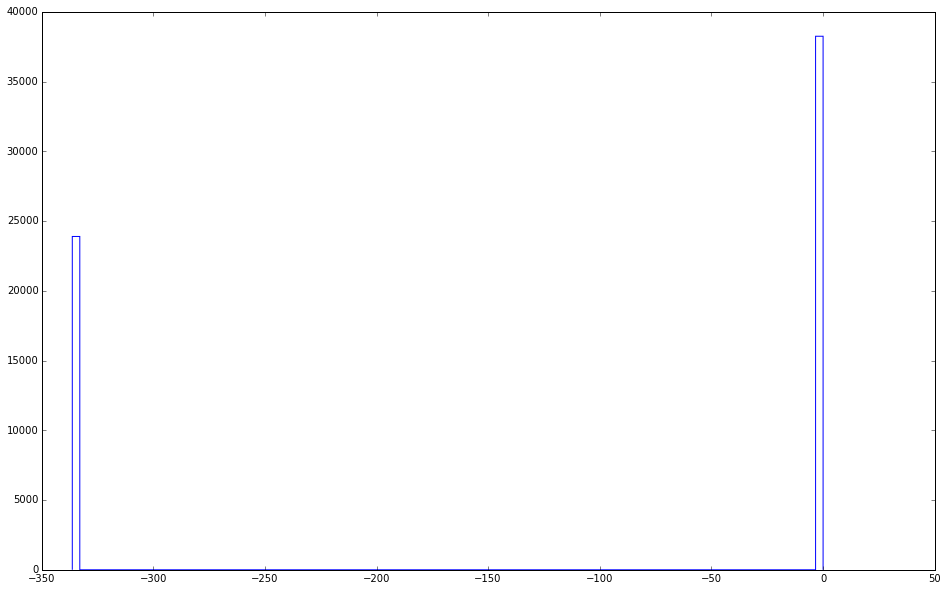

In [44]:
plt.hist(dsep, bins=100, histtype='step')
None

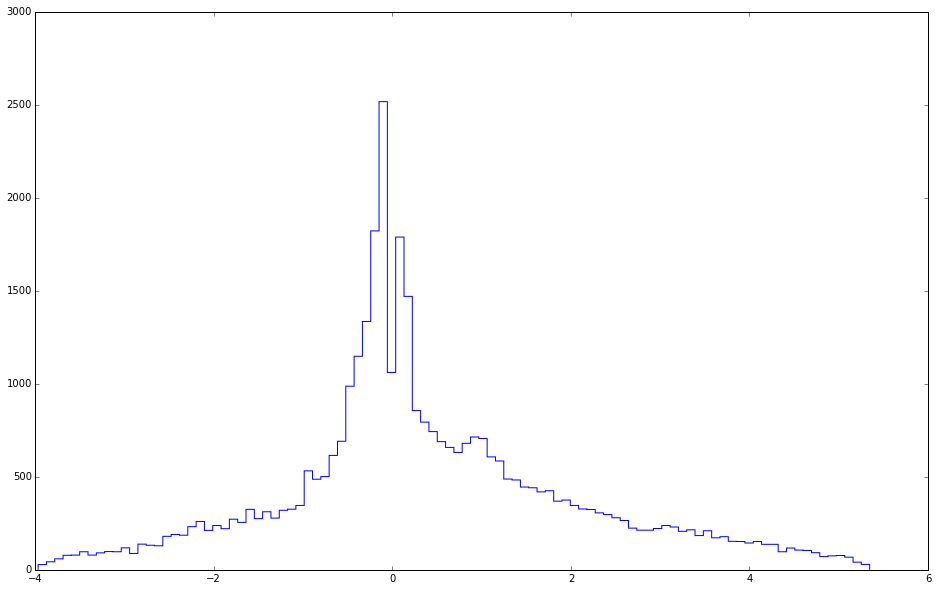

In [45]:
plt.hist(dsep[np.abs(dsep)<10*u.deg].arcsec, bins=100, histtype='step')
None

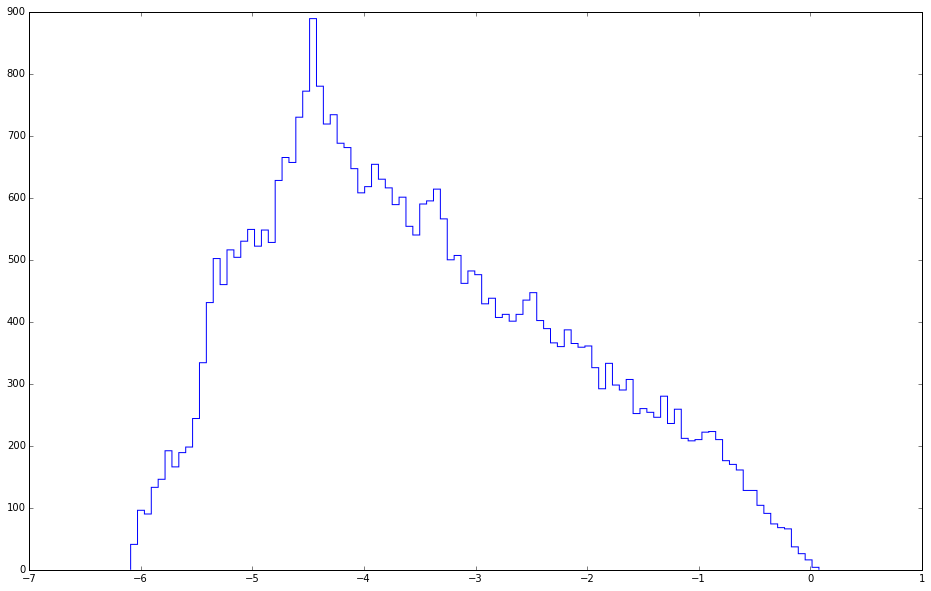

In [51]:
plt.hist(dsep_kpc[np.abs(dsep)<10*u.deg].to(u.kpc), bins=100, histtype='step')
None